# Applying XID+CIGALE to Extreme Starbursts
In this notebook, we read in the data files and prepare them for fitting with XID+CIGALE, the SED prior model extension to XID+. Here we focus on the source `HELP_J104631.170+591036.829`. This source is in [Rowan-Robinson et al. 2018](https://arxiv.org/abs/1704.07783) and claimed to have a star formation rate of $> 10^{3}\mathrm{M_{\odot}yr^{-1}}$

Import required modules

In [1]:
from astropy.io import ascii, fits
from astropy.table import Table
import pylab as plt
%matplotlib inline
from astropy import wcs


import numpy as np
import xidplus
from xidplus import moc_routines
import pickle

/Users/pdh21/anaconda3/envs/xidplus/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
priors,_=xidplus.load('XID+CIGALE_ESB32.pkl')

In [3]:
prior_list=Table.read('prior_list.ascii',format='ascii')

In [4]:
prior_list['f_irac_i1']

1.31712494543498
1.70243749953889
13.9845644297571
0.718902791346449
7.20627172041193
16.9368640624039
5.25422820780818
--
1.50049386135875
3.22031996449431
6.74205626406394


### Set SED priors
Now lets set the SED priors. Note redshift and temperature need to be transformed into log10. To get the appropriate prior uncertianty, I will use:
![](https://wikimedia.org/api/rest_v1/media/math/render/svg/e5a771330b5db50ddce6342c2932604ef0afad23)
![](https://wikimedia.org/api/rest_v1/media/math/render/svg/fc9f7d8cc90a45d4802860f27d2911b09bf4a8a5)

In [5]:
def log10_sig(mu,sig):
    return sig/(mu*np.log(10))

In [6]:
z_mu=np.empty((priors[1].nsrc))
z_sig=np.empty((priors[1].nsrc))
f_irac=np.empty((priors[1].nsrc))
f_irac_sig=np.empty((priors[1].nsrc))
for x,i in enumerate(priors[1].ID):
    ind=prior_list['help_id']==i
    z_mu[x]=prior_list['redshift'][ind]
    z_sig[x]=prior_list['redshift_unc'][ind]
    f_irac[x]=prior_list['f_irac_i1'][ind]/1000.0
    f_irac_sig[x]=prior_list['ferr_irac_i1'][ind]/1000.0
#transform to log10
z_sig=log10_sig(z_mu,0.1*z_mu)
#z_sig=log10_sig(z_mu,z_sig)
z_mu = np.log10(z_mu)
#z_sig[z_sig<0.05]=0.05
sfr_mu=1.5*z_mu+1.0
sfr_sig=np.full(priors[1].nsrc,0.5)

agn_frac_mu=np.full(priors[1].nsrc,-1)
agn_frac_sig=np.full(priors[1].nsrc,1)

(array([1., 1., 0., 0., 2., 0., 2., 2., 0., 2.]),
 array([-0.94119451, -0.82093212, -0.70066973, -0.58040733, -0.46014494,
        -0.33988255, -0.21962016, -0.09935776,  0.02090463,  0.14116702,
         0.26142942]),
 <a list of 10 Patch objects>)

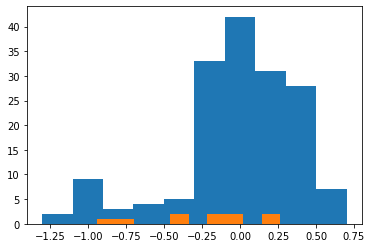

In [7]:
plt.hist(z_mu[np.isfinite(f_irac)])
plt.hist(z_mu[np.isnan(f_irac)])

## Missing IRAC data set to min

In [8]:
f_irac_sig[np.isnan(f_irac)]=np.nanmin(f_irac)
f_irac[np.isnan(f_irac)]=np.nanmin(f_irac)


In [9]:

#params_mu=np.vstack((sfr_mu,agn_frac_mu,z_mu)).T
#params_sig=np.vstack((sfr_sig,agn_frac_sig,z_sig)).T
#params_names=['log10sfr','agn_frac','log10z']
#emulator_path='/Users/pdh21/Google_Drive/WORK/XID_plus/docs/notebooks/examples/SED_emulator/CIGALE_emulator_20210310_log10sfr_uniformAGN_log10z.pkl'

In [9]:
params_mu=np.vstack((sfr_mu,z_mu)).T
params_sig=np.vstack((sfr_sig,z_sig)).T
params_names=['log10sfr','log10z']
emulator_path='/Users/pdh21/Google_Drive/WORK/XID_plus/docs/notebooks/examples/SED_emulator/CIGALE_emulator_20210311_log10sfr_uniformAGN_log10z_irac1.pkl'

In [10]:
class hier_prior(object):
    def __init__(self,ID,params_mu,params_sig,params_names,emulator_path):
        """Initiate SED prior class
        
        :param params_mu array with mean values of parameters
        :param params_sig array with sigma values of parameters
        :param params_names list of names of params
        :param emulator_path path to saved emulator file"""
        
        from astropy.table import Table, join
        from xidplus.numpyro_fit.misc import load_emulator
        mu_table=Table(params_mu,names=[i+'_mu' for i in params_names])
        sig_table=Table(params_sig,names=[i+'_sig' for i in params_names])
        
        mu_table.add_column(ID, name='ID')
        sig_table.add_column(ID, name='ID')
        import jax.numpy as jnp
        self.prior_table=join(mu_table,sig_table,keys='ID')
        
        self.emulator=load_emulator(emulator_path)
        self.params_mu=jnp.asarray(params_mu)
        self.params_sig=jnp.asarray(params_sig)

In [11]:
phys_prior=hier_prior(priors[1].ID,params_mu,params_sig,params_names,emulator_path)

W0312 16:46:36.591181 4542238144 xla_bridge.py:135] No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


## Generate Prior Predictive Distribtion

In [12]:
from numpyro.infer import Predictive
from jax import random, vmap
from xidplus.numpyro_fit import SED_prior

rng_key = random.PRNGKey(0)
rng_key, rng_key_ = random.split(rng_key)

In [13]:
agn_frac_mu=np.full(priors[1].nsrc,-1)
agn_frac_sig=np.full(priors[1].nsrc,1)
agn_frac=1.0/(1.0+np.exp(-1.*np.random.normal(agn_frac_mu,agn_frac_sig)))

In [14]:
## FOr numpyro to sample from the prior, the data needs to be set to None
import copy
#make a deepcopy of the priors
priors_prior_pred=copy.deepcopy(priors)
#set data to None
for i in range(0,len(priors)):
    priors_prior_pred[i].sim=None

In [15]:
%%time 
#sample from the prior using numpyro's Predictive function
prior_predictive=Predictive(SED_prior.irac_spire_model_fix_agn,posterior_samples = {}, num_samples = 50,)
prior_pred=prior_predictive(random.PRNGKey(0),priors_prior_pred,phys_prior,agn_frac,f_irac,f_irac_sig)

CPU times: user 5.33 s, sys: 187 ms, total: 5.52 s
Wall time: 7.57 s


In [16]:
#Create a list of the model map arrays
mod_map_array=[prior_pred['obs_mips24'].T,prior_pred['obs_psw'].T,prior_pred['obs_pmw'].T,prior_pred['obs_plw'].T]

In [17]:
import jax.numpy as jnp


params_tmp = jnp.stack((prior_pred['params'][:,:, 0], np.tile(agn_frac,(50,1)),prior_pred['params'][:,:, 1])).T
src_f=jnp.swapaxes(jnp.power(10.0,phys_prior.emulator['net_apply'](phys_prior.emulator['params'],params_tmp)).T,0,1)
#src_f=jnp.power(10.0,phys_prior.emulator['net_apply'](phys_prior.emulator['params'],prior_pred['params']))


In [18]:
params_tmp.shape

(174, 50, 3)

In [19]:
src_f_2=phys_prior.emulator['net_apply'](phys_prior.emulator['params'],params_tmp)

In [71]:
src_f_2.shape

(174, 50, 5)

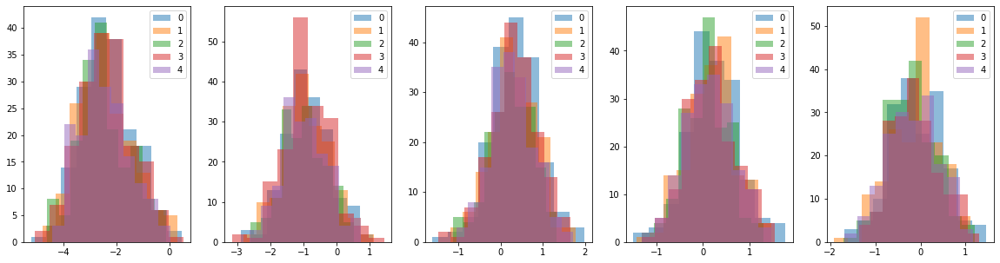

In [20]:
fig,axes=plt.subplots(1,5,figsize=(20,5))
for j in range(0,5):
    for i in range(0,5):
        axes[j].hist(src_f_2[:,i,j],label=str(i),alpha=0.5)
    axes[j].legend()

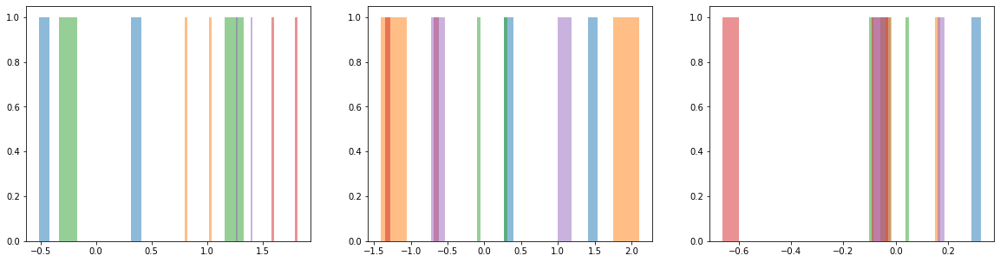

In [46]:
fig,axes=plt.subplots(1,3,figsize=(20,5))
for j in range(0,3):
    for i in range(0,5):
        axes[j].hist(prior_pred['params_base'][i,:,j],alpha=0.5)

In [63]:
from numpyro.infer import init_to_sample

Help on function init_to_sample in module numpyro.infer.initialization:

init_to_sample(site=None)
    Initialize to a prior sample. For priors with no `.sample` method implemented,
    we defer to the :func:`init_to_uniform` strategy.



In [60]:
prior_pred.keys()

dict_keys(['bkg', 'obs_f_irac1', 'obs_mips24', 'obs_plw', 'obs_pmw', 'obs_psw', 'params', 'params_base'])

In [48]:
like=log_likelihood(SED_prior.irac_spire_model_fix_agn,prior_pred,priors_prior_pred,phys_prior,agn_frac,f_irac,f_irac_sig)

In [62]:
help(init_to_sample)


Help on function init_to_sample in module numpyro.infer.initialization:

init_to_sample(site=None)
    Initialize to a prior sample. For priors with no `.sample` method implemented,
    we defer to the :func:`init_to_uniform` strategy.



How do changes in parameter space change flux?

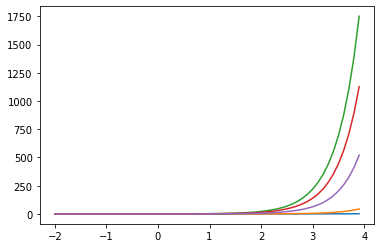

In [28]:
sfr_step=np.arange(-2,4,0.1)
tmp_flux=jnp.power(10.0,phys_prior.emulator['net_apply'](phys_prior.emulator['params'],np.vstack((sfr_step,np.full(sfr_step.size,0.1),np.full(sfr_step.size,0.0))).T))

for b in range(0,tmp_flux.shape[1]):
    plt.plot(sfr_step,tmp_flux[:,b])

In [25]:
prior_pred['params'].shape,src_f.shape

((50, 174, 2), (50, 5, 174))

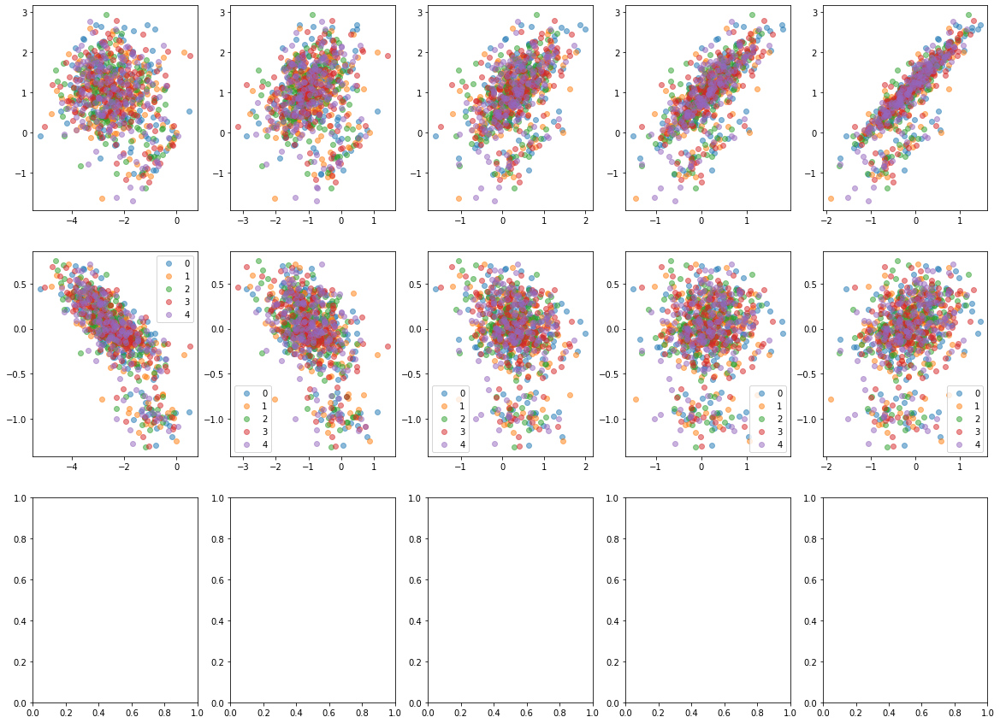

In [21]:
fig,axes=plt.subplots(3,5,figsize=(20,15))
for j in range(0,5):
    for i in range(0,5):
        for p in range(0,2):
            axes[p,j].plot(src_f_2[:,i,j,],prior_pred['params'][i,:,p],'o',label=str(i),alpha=0.5)
    axes[p,j].legend()


## Can I fit with fixing redshift?

First, I need to create new phys_prior

In [22]:
phys_prior_fix=hier_prior(priors[1].ID,params_mu,params_sig,['log10sfr','log10z'],emulator_path)

In [24]:
num_samp=1

for s in [0]:
    print(s)
    #make a deepcopy of the priors
    priors_prior_pred_samp=copy.deepcopy(priors)
    #set data to sample data
    for i in range(0,4):
        priors_prior_pred_samp[i].sim=mod_map_array[i][:,s]
    phys_prior_samp=copy.deepcopy(phys_prior)
    
    fit_numpyro=SED_prior.all_bands_irac_fix_agn(priors_prior_pred_samp,phys_prior, agn_frac,10.0**src_f_2[:,s,0],f_irac_sig,num_chains=1,num_samples=100,num_warmup=500)

0


sample: 100%|██████████| 600/600 [14:33<00:00,  1.46s/it, 1023 steps of size 2.63e-03. acc. prob=0.90]


In [25]:
samples=fit_numpyro.get_samples()

In [26]:
fit_numpyro.get_extra_fields()

{'diverging': DeviceArray([False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False, False, False, False, False,
              False, False, False, False], dtype=bool),
 'potential_energy': DeviceArray([-42278.258, -42301.45 , -42294.543, -42292.688, -42290.95

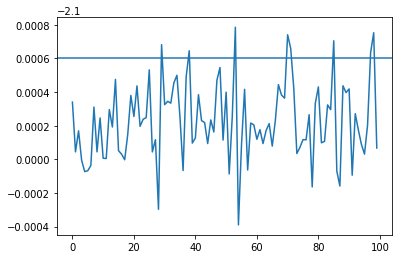

In [27]:
b=0
plt.plot(samples['bkg'][:,b])
plt.axhline(prior_pred['bkg'][s,b])

In [28]:
%%time 
#sample from the prior using numpyro's Predictive function
prior_predictive_samp=Predictive(SED_prior.irac_spire_model_fix_agn,posterior_samples = samples, num_samples = 50)
prior_pred_samp=prior_predictive_samp(random.PRNGKey(0),priors_prior_pred,phys_prior, agn_frac,[None]*priors[0].nsrc,f_irac_sig)
mod_map_array_samp=[prior_pred_samp['obs_mips24'].T,prior_pred_samp['obs_psw'].T,prior_pred_samp['obs_pmw'].T,prior_pred_samp['obs_plw'].T]

CPU times: user 3.32 s, sys: 223 ms, total: 3.54 s
Wall time: 3.52 s


In [125]:
prior_pred_samp

{'obs_f_irac1': DeviceArray([[0.2973142 , 0.00117169, 0.00107681, ..., 0.00059071,
               0.00287978, 0.00103151],
              [0.2973142 , 0.00117169, 0.00107681, ..., 0.00059071,
               0.00287978, 0.00103151],
              [0.2973142 , 0.00117169, 0.00107681, ..., 0.00059071,
               0.00287978, 0.00103151],
              ...,
              [0.2973142 , 0.00117169, 0.00107681, ..., 0.00059071,
               0.00287978, 0.00103151],
              [0.2973142 , 0.00117169, 0.00107681, ..., 0.00059071,
               0.00287978, 0.00103151],
              [0.2973142 , 0.00117169, 0.00107681, ..., 0.00059071,
               0.00287978, 0.00103151]], dtype=float32),
 'obs_mips24': DeviceArray([[-2.058257 , -2.074835 , -2.0821893, ..., -2.091423 ,
               -2.06203  , -2.104423 ],
              [-2.058257 , -2.074835 , -2.0821893, ..., -2.091423 ,
               -2.06203  , -2.104423 ],
              [-2.058257 , -2.074835 , -2.0821893, ..., -2.091423 ,
   

In [29]:
#feed the model map arrays the animation function
xidplus.plots.make_map_animation(priors_prior_pred_samp,mod_map_array_samp,50)

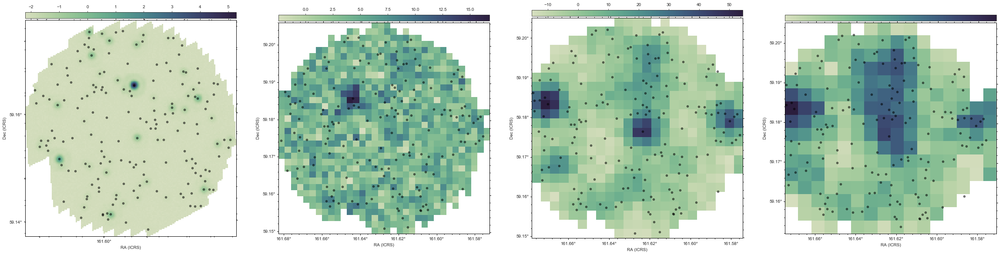

In [30]:
figures,fig=xidplus.plot_map(priors_prior_pred_samp)

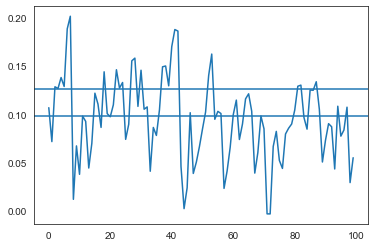

In [31]:
f=100
plt.plot(prior_pred_samp['params'][:,f,1])
plt.axhline(prior_pred['params'][s,f,2])
plt.axhline(z_mu[f]+z_sig[f])

In [96]:
prior_pred['params'].shape

(50, 174, 2)

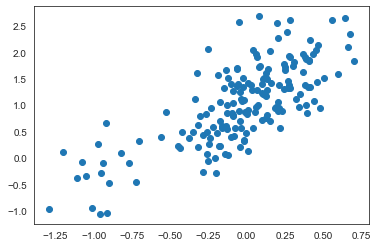

In [49]:
plt.plot(prior_pred['params'][s,:,1],np.mean(prior_pred_samp['params'],axis=0)[:,0],'o')

In [ ]:
prior_pred['params'][s,f,0]

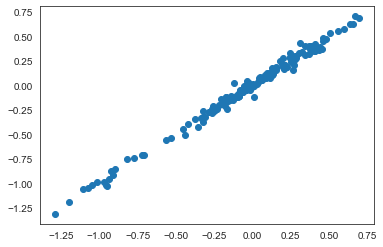

In [33]:
plt.plot(prior_pred['params'][s,:,1],np.mean(prior_pred_samp['params'],axis=0)[:,1],'o')

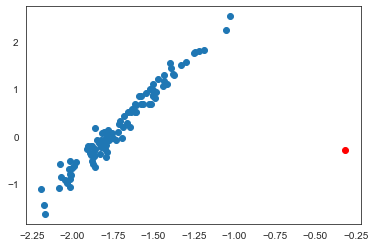

In [48]:
f=1
plt.plot(samples['params_base'][:,f,0],samples['params_base'][:,f,1],'o')
#plt.plot(prior_pred['params'][s,f,0],prior_pred['params'][s,f,1],'ro')

(array([ 2.,  3.,  9.,  4.,  7.,  7., 10., 15., 22., 95.]),
 array([0.04203803, 0.13783234, 0.23362664, 0.32942094, 0.42521525,
        0.52100955, 0.61680385, 0.71259816, 0.80839246, 0.90418676,
        0.99998107]),
 <a list of 10 Patch objects>)

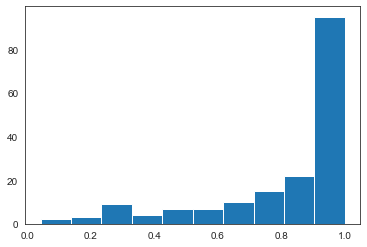

In [57]:
plt.hist([np.corrcoef(a,b)[0,1] for a,b in zip(samples['params_base'][:,:,0].T,samples['params_base'][:,:,1].T)])

In [63]:
np.eye(2)

array([[1., 0.],
       [0., 1.]])

In [58]:
import numpyro
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS
from numpyro.infer.reparam import TransformReparam
import jax.numpy as jnp
from jax import random
import numpy as np
import jax
import pickle
import os
from xidplus.numpyro_fit.misc import sp_matmul, load_emulator

numpyro.set_host_device_count(os.cpu_count())

def irac_spire_model_fix_agn(priors,sed_prior,agn,f_irac1,f_irac1_sig):
    pointing_matrices = [([p.amat_row, p.amat_col], p.amat_data) for p in priors]


    bkg_mu= np.asarray([p.bkg[0] for p in priors]).T
    bkg_sig = np.asarray([p.bkg[1] for p in priors]).T
    #lir_mu=numpyro.sample('lir_mu',dist.Normal(10,1))
    #lir_sig=numpyro.sample('lir_sig',dist.HalfCauchy(1,0.5))

    #params_mu=sed_prior.params_mu
    #params_mu[:,0]=lir_mu
    #params_sig=sed_prior.params_sig
    #params_sig[:,0]=lir_sig
    with numpyro.plate('bands', len(priors)):

        #sigma_conf = numpyro.sample('sigma_conf', dist.HalfCauchy(1,0.5))
        bkg = numpyro.sample('bkg', dist.Normal(bkg_mu,bkg_sig))


    with numpyro.plate('nsrc', priors[0].nsrc):
        with numpyro.handlers.reparam(config={"params":TransformReparam()}):
            params = numpyro.sample('params', dist.TransformedDistribution(dist.MultivariateNormal(np.zeros(2),np.eye(2)),dist.transforms.AffineTransform(sed_prior.params_mu,sed_prior.params_sig)))
        #sfr=numpyro.sample('sfr',dist.Normal(sed_prior.params_mu[:,0],sed_prior.params_sig[:,0]))
        #agn_frac=numpyro.sample('agn_frac',dist.Normal(sed_prior.params_mu[:,1],sed_prior.params_sig[:,1]))
        #redshift=numpyro.sample('redshift',dist.Normal(sed_prior.params_mu[:,2],sed_prior.params_sig[:,2]))
    params_tmp = jnp.hstack((params[:,0][:,None], agn[:,None], params[:,1][:,None]))

    src_f=jnp.power(10.0,sed_prior.emulator['net_apply'](sed_prior.emulator['params'],params_tmp))

    #src_f = numpyro.sample('src_f', dist.(flux_lower, flux_upper))
    db_hat_mips24 = sp_matmul(pointing_matrices[0], src_f[:, 1][:, None], priors[0].snpix).reshape(-1) + bkg[0]
    db_hat_psw = sp_matmul(pointing_matrices[1], src_f[:, 1][:, None], priors[1].snpix).reshape(-1) + bkg[1]
    db_hat_pmw = sp_matmul(pointing_matrices[2], src_f[:, 3][:, None], priors[2].snpix).reshape(-1) + bkg[2]
    db_hat_plw = sp_matmul(pointing_matrices[3], src_f[:, 4][:, None], priors[3].snpix).reshape(-1) + bkg[3]

    #sigma_tot_psw = jnp.sqrt(jnp.power(priors[0].snim, 2) + jnp.power(sigma_conf[0], 2))
    #sigma_tot_pmw = jnp.sqrt(jnp.power(priors[1].snim, 2) + jnp.power(sigma_conf[1], 2))
    #sigma_tot_plw = jnp.sqrt(jnp.power(priors[2].snim, 2) + jnp.power(sigma_conf[2], 2))
    with numpyro.plate('f_irac1_sources',f_irac1_sig.size):
        numpyro.sample("obs_f_irac1",dist.Normal(src_f[:,0],f_irac1_sig),
                       obs=f_irac1)
    with numpyro.plate('mips24_pixels', priors[0].snim.size):  # as ind_psw:
        numpyro.sample("obs_mips24", dist.Normal(db_hat_mips24,priors[0].snim ),
                       obs=priors[0].sim)
    with numpyro.plate('psw_pixels', priors[1].snim.size):  # as ind_psw:
        numpyro.sample("obs_psw", dist.Normal(db_hat_psw,priors[1].snim ),
                                 obs=priors[1].sim)
    with numpyro.plate('pmw_pixels', priors[2].snim.size):  # as ind_pmw:
        numpyro.sample("obs_pmw", dist.Normal(db_hat_pmw, priors[2].snim),
                                 obs=priors[2].sim)
    with numpyro.plate('plw_pixels', priors[3].snim.size):  # as ind_plw:
        numpyro.sample("obs_plw", dist.Normal(db_hat_plw, priors[3].snim),
                                 obs=priors[3].sim)
    return [db_hat_mips24,db_hat_psw,db_hat_pmw,db_hat_plw]

def all_bands_irac_fix_agn(priors,sed_prior,agn,f_irac1,f_irac1_sig,num_samples=500,num_warmup=500,num_chains=4,chain_method='parallel'):
    from numpyro.infer.reparam import LocScaleReparam
    from numpyro.handlers import reparam
    numpyro.set_host_device_count(os.cpu_count())
    reparam_model=reparam(irac_spire_model_fix_agn, config={'params': LocScaleReparam(0)})
    nuts_kernel = NUTS(reparam_model)
    mcmc = MCMC(nuts_kernel, num_samples=num_samples, num_warmup=num_warmup,num_chains=num_chains,chain_method=chain_method)
    rng_key = random.PRNGKey(0)
    mcmc.run(rng_key, priors,sed_prior,agn,f_irac1,f_irac1_sig,extra_fields=('potential_energy',))
    return mcmc

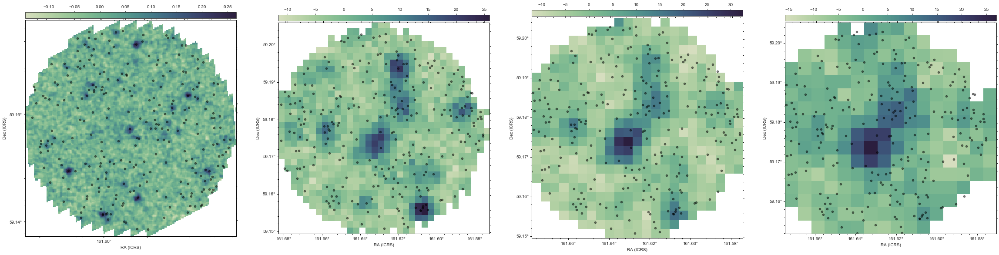

In [55]:
figures,fig=xidplus.plot_map(priors)

## Fit the simulated observations
To check whether `numpyro` can fit accurately, we will fit some of the prior predictive samples

Are redshift transforamtions causing a problem?

In [99]:
s=0
ind_low=prior_pred['params'][s,:,2]<-2
prior_pred['params'][s,ind_low,2],params_mu[ind_low,2],params_sig[ind_low,2]

(DeviceArray([-2.0749831], dtype=float32),
 array([-0.7242281]),
 array([0.85339901]))

In [114]:
z_sig_tmp[ind_low],z_mu_tmp[ind_low]

(array([0.3708]), array([0.1887]))

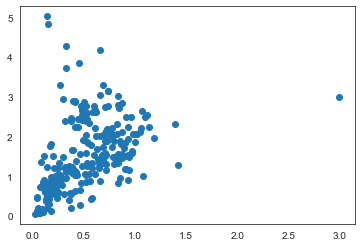

In [118]:
plt.plot(prior_list['redshift_unc'],prior_list['redshift'],'o')

In [104]:
z_mu_tmp=np.empty((priors[1].nsrc))
z_sig_tmp=np.empty((priors[1].nsrc))
for x,i in enumerate(priors[1].ID):
    ind=prior_list['help_id']==i
    z_mu_tmp[x]=prior_list['redshift'][ind]
    z_sig_tmp[x]=prior_list['redshift_unc'][ind]

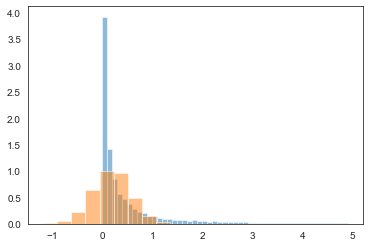

In [120]:
plt.hist(10.0**np.random.normal(params_mu[ind_low,2],params_sig[ind_low,2],10000),bins=np.arange(-0.1,5,0.1),alpha=0.5,normed=True);
plt.hist(np.random.normal(z_mu_tmp[ind_low],z_sig_tmp[ind_low],10000),alpha=0.5,normed=True);

In [105]:
num_samp=2
posteriors=[]
for s in range(0,num_samp):
    print(s)
    #make a deepcopy of the priors
    priors_prior_pred_samp=copy.deepcopy(priors)
    #set data to sample data
    for i in range(0,4):
        priors_prior_pred_samp[i].sim=mod_map_array[i][:,s]
    phys_prior_samp=copy.deepcopy(phys_prior)
    
    fit_numpyro=SED_prior.all_bands(priors_prior_pred_samp,phys_prior,num_chains=2,num_samples=500,num_warmup=500)
    posteriors.append(xidplus.posterior_numpyro_sed(fit_numpyro,priors_prior_pred_samp,phys_prior))


0


KeyboardInterrupt: 

0
1


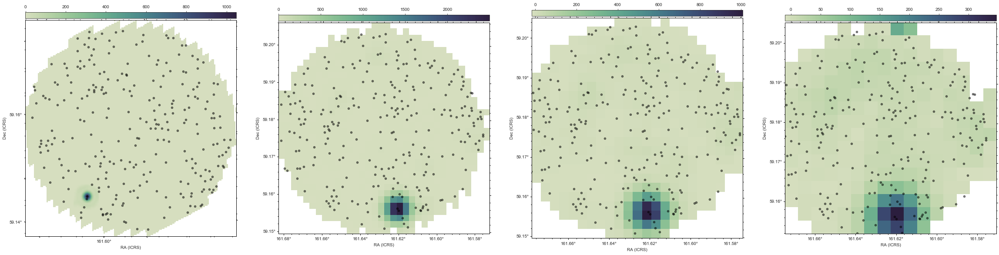

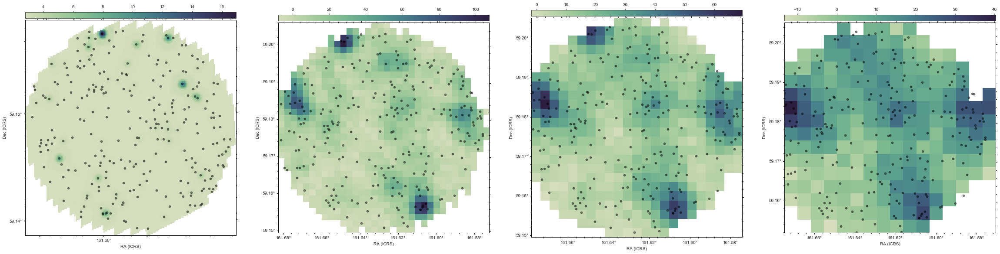

In [57]:
figures=[]
for s in range(0,num_samp):
    print(s)
    #make a deepcopy of the priors
    priors_prior_pred_samp=copy.deepcopy(priors)
    #set data to sample data
    for i in range(0,4):
        priors_prior_pred_samp[i].sim=mod_map_array[i][:,s]
    _,fig=xidplus.plot_map(priors_prior_pred_samp)
    figures.append(fig)
    xidplus.save(priors_prior_pred_samp,posteriors[s],'Prior_pred_fits_{}'.format(s))

In [24]:
sites = fit_numpyro._states[fit_numpyro._sample_field].keys()

In [25]:
fit_numpyro.get_samples()

{'bkg': DeviceArray([[ 1.9660889 ,  0.35470602,  1.905001  , -1.6193085 ],
              [ 1.9660889 ,  0.35470602,  1.905001  , -1.6193085 ],
              [ 1.9660889 ,  0.35470602,  1.905001  , -1.6193085 ],
              ...,
              [ 3.0515983 , -0.9065646 , -0.06974573,  0.5665145 ],
              [ 3.0515983 , -0.9065646 , -0.06974573,  0.5665145 ],
              [ 3.0515983 , -0.9065646 , -0.06974573,  0.5665145 ]],            dtype=float32),
 'params': DeviceArray([[[-2.8308597 , -2.5722308 , -1.5037224 ],
               [-1.7653073 , -2.6568022 , -0.11517272],
               [ 1.5739826 , -1.5827551 ,  0.3877085 ],
               ...,
               [ 0.2497921 , -1.721874  ,  0.34911746],
               [ 1.114767  , -2.1084337 ,  0.33432898],
               [ 3.4458463 , -0.34348089,  0.25139543]],
 
              [[-2.8308597 , -2.5722308 , -1.5037224 ],
               [-1.7653073 , -2.6568022 , -0.11517272],
               [ 1.5739826 , -1.5827551 ,  0.3877085 ],
 

### Where are the divergences occuring?

IndexError: list index out of range

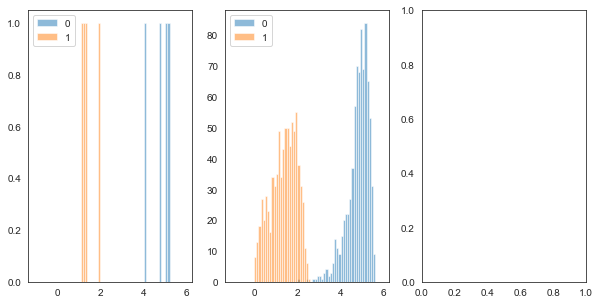

In [58]:
fig,axes=plt.subplots(1,len(sites),figsize=(10,5))
for j in range(0,len(sites)):
    for i in range(0,len(posteriors)): 
        axes[j].hist(np.log10(posteriors[i].Rhat[j][np.isfinite(posteriors[i].Rhat[j])]),bins=np.arange(-1,6,0.1),alpha=0.5,label=str(i))
    axes[j].legend()

In [219]:
np.full(10,'')

array(['', '', '', '', '', '', '', '', '', ''], dtype='<U1')

samples 1 and 3 it struggled with. What were the parameters of those samples?

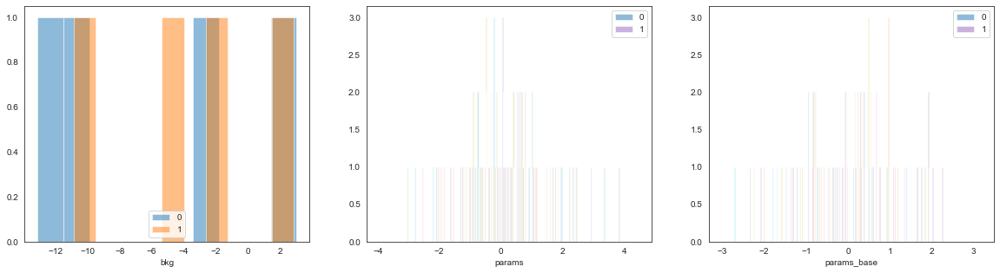

In [39]:
fig,axes=plt.subplots(1,len(sites),figsize=(20,5))
for j in range(0,len(sites)):
    for i in range(0,len(posteriors)):
        axes[j].hist(prior_pred[[n for n in sites][j]][i,:],alpha=0.5,label=str(i))
    axes[j].legend()
    axes[j].set_xlabel([n for n in sites][j])

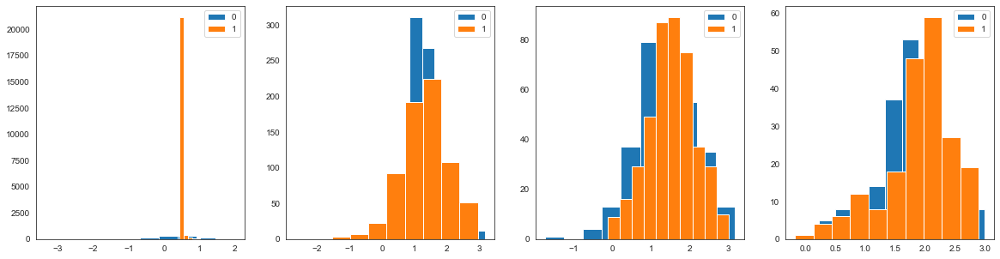

In [40]:
fig,axes=plt.subplots(1,len(priors),figsize=(20,5))
for j in range(0,len(priors)):
    for i in range(0,len(posteriors)):
        axes[j].hist(np.log10(mod_map_array[j][:,i]),label=str(i))
    axes[j].legend()
    

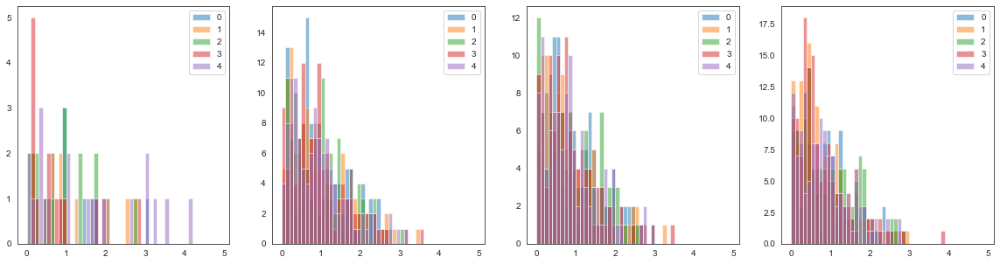

In [222]:
fig,axes=plt.subplots(1,len(priors),figsize=(20,5))
for j in range(0,len(priors)):
    for i in range(0,len(posteriors)):
        axes[j].hist(np.log10(src_f[:,i,j]),bins=np.arange(0,5,0.1),label=str(i),alpha=0.5)
    axes[j].legend()

In [129]:
s=3
print(prior_pred['agn_frac'][s,src_f[:,s,0]>60],prior_pred['sfr'][s,src_f[:,s,0]>60],10.0**prior_pred['redshift'][s,src_f[:,s,0]>60])

[] [] []


In [155]:
print(z_mu[src_f[:,s,0]>60],z_sig[src_f[:,s,0]>60])

[2.0122] [0.7613]


In [ ]:
[0.30367114] [0.16431189]

In [154]:
for x,i in enumerate(priors[1].ID):
    ind=prior_list['help_id']==i
    z_mu[x]=prior_list['redshift'][ind]
    z_sig[x]=prior_list['redshift_unc'][ind]
#z_sig=log10_sig(z_mu,z_sig)
#z_mu = np.log10(z_mu)

Text(0, 0.5, 'log10z')

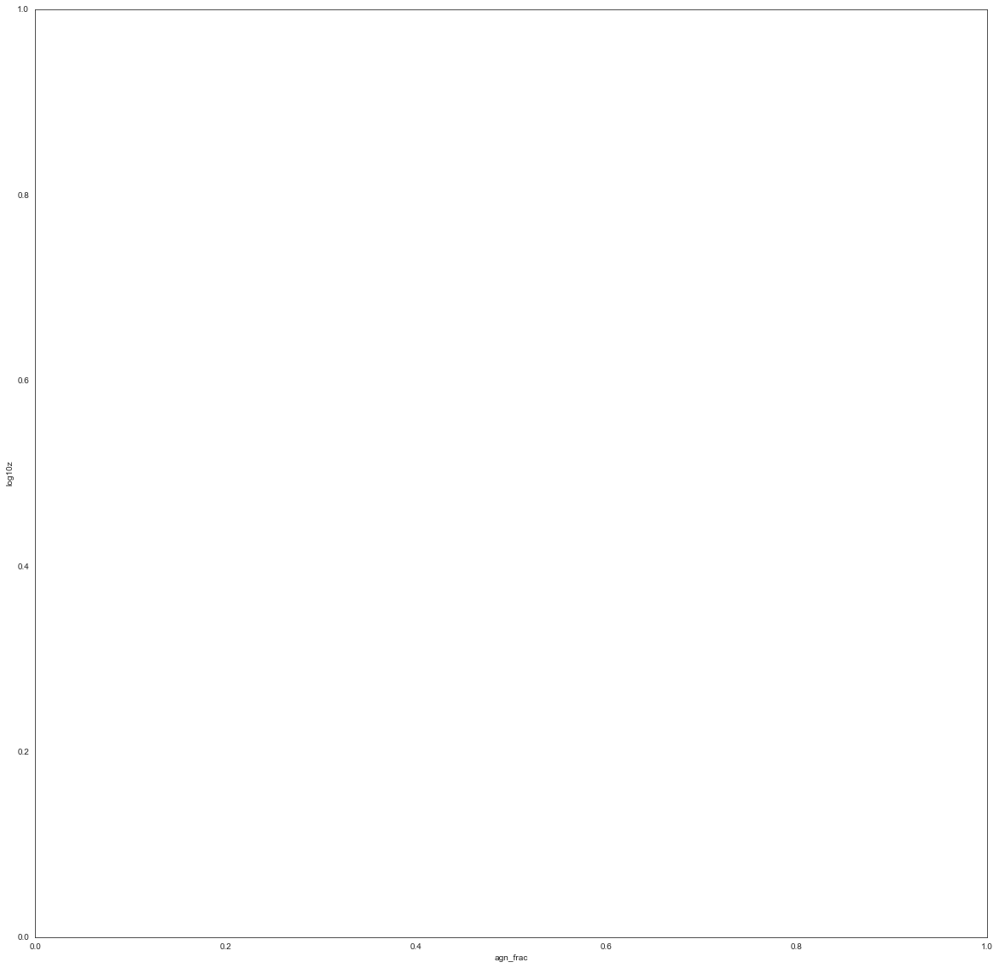

In [43]:
plt.figure(figsize=(20,20))
names=[i.split('_mu')[0] for i in phys_prior.prior_table.colnames[0:3]]
for s in range(0,num_samp):
    if posteriors[s].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    #plt.plot(phys_samp_prior_pred[s,:,2],phys_samp_prior_pred[s,:,0],'o',color=color,alpha=0.5)
plt.xlabel(names[2])
plt.ylabel(names[0])


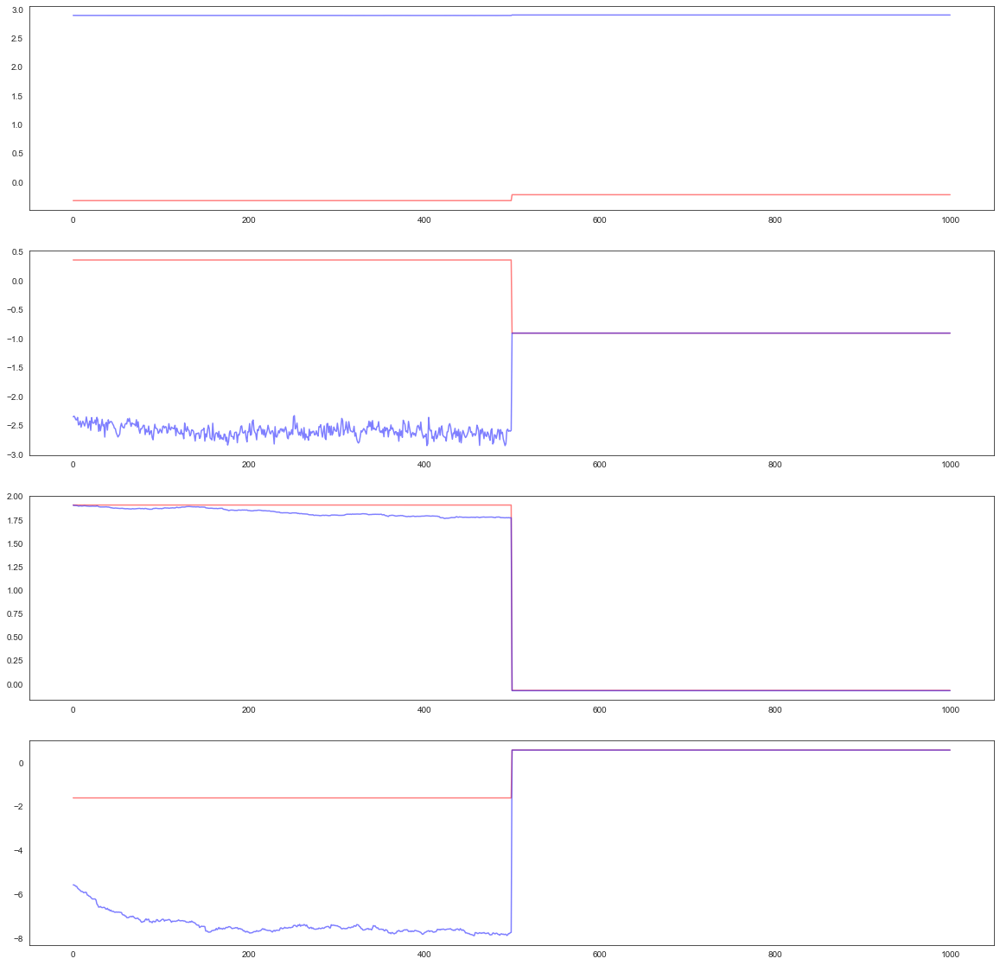

In [59]:
fig,axes=plt.subplots(4,1,figsize=(20,20))
for i in range(0,num_samp):
    if posteriors[i].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    for b in range(0,4):
        axes[b].plot(posteriors[i].samples['bkg'][:,b],color=color,alpha=0.5)

In [123]:
prior_pred['bkg'][1,:]

DeviceArray([  2.8799236,  -4.4573026,  -1.5422723, -10.859352 ], dtype=float32)

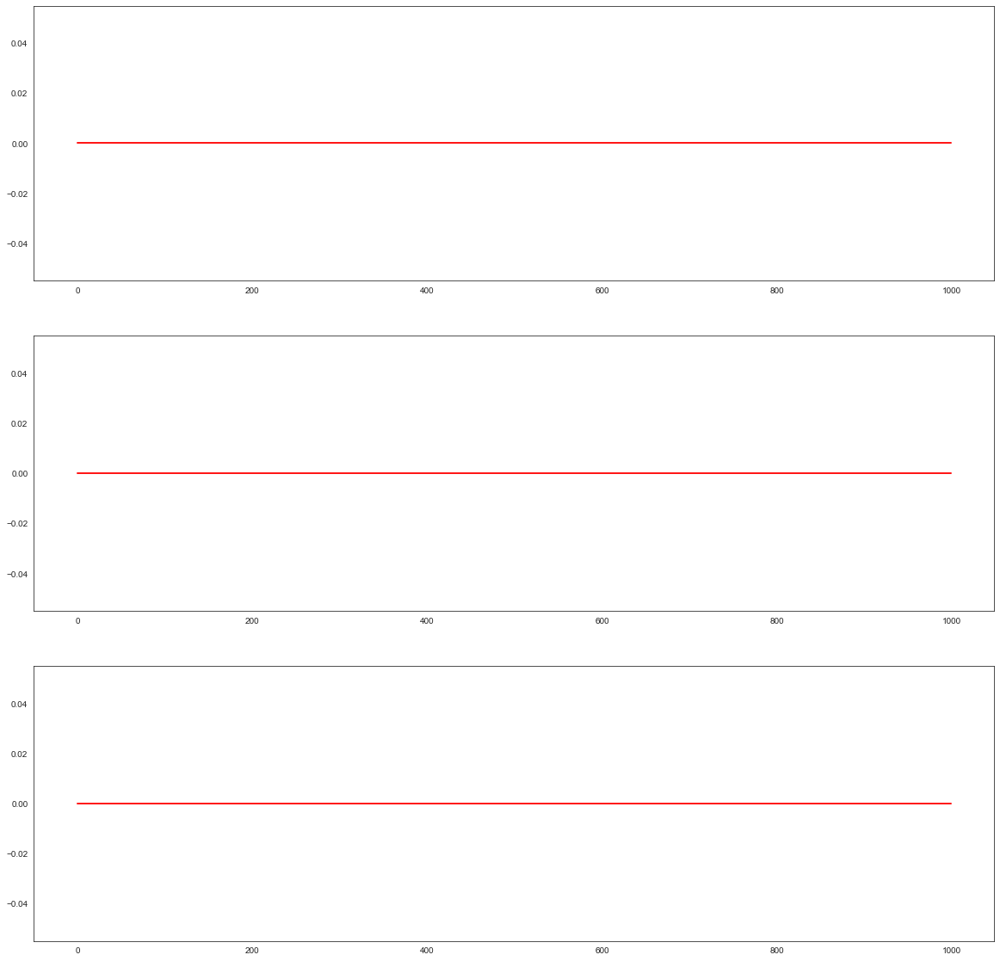

In [45]:
fig,axes=plt.subplots(3,1,figsize=(20,20))
for i in range(0,num_samp):
    if posteriors[i].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    for b in range(0,3):
        axes[b].plot(posteriors[i].samples['sigma_conf'][:,b],color=color,alpha=0.5)

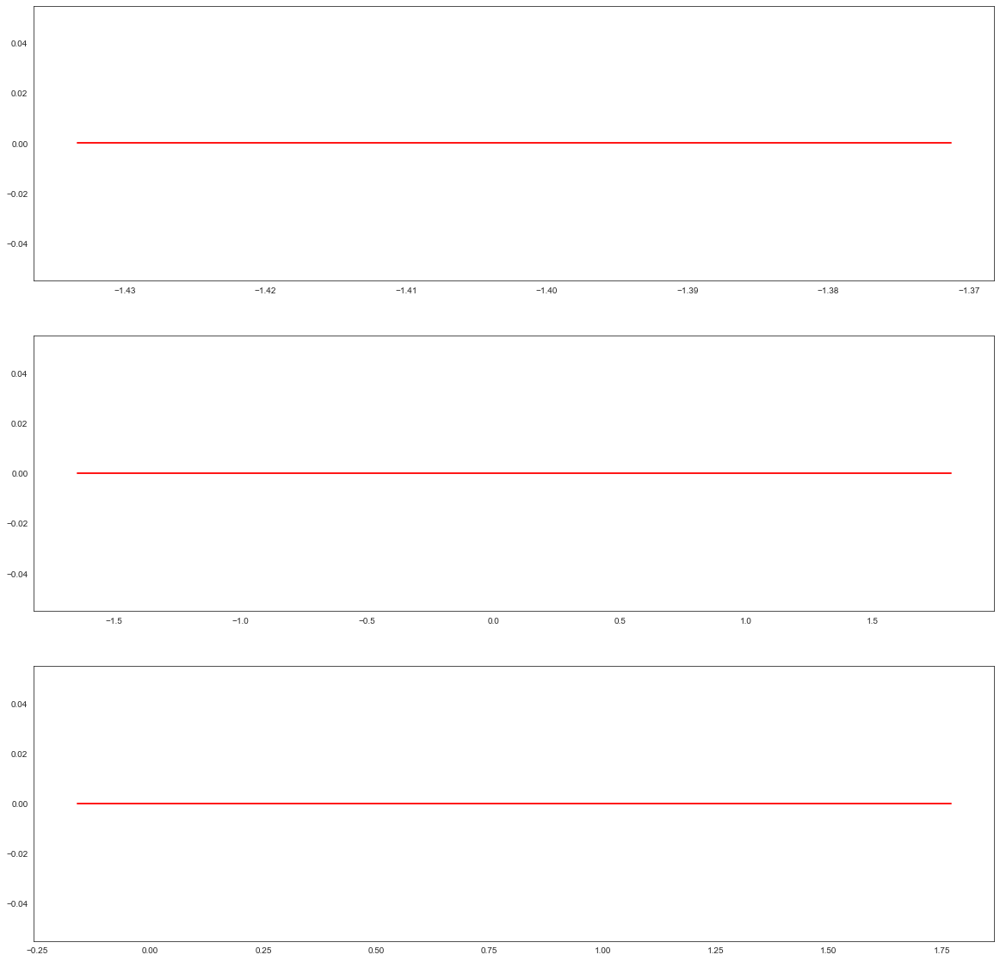

In [46]:
fig,axes=plt.subplots(3,1,figsize=(20,20))
for i in range(0,num_samp):
    if posteriors[i].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    for b in range(0,3):
        axes[b].plot(posteriors[i].samples['bkg'][:,b],posteriors[i].samples['sigma_conf'][:,b],color=color,alpha=0.5)

KeyError: 'sigma_conf'

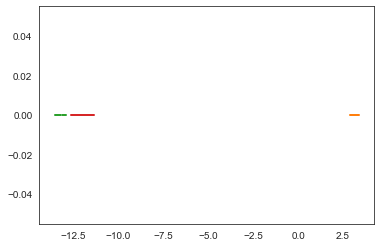

In [73]:
s=0
plt.plot(posteriors[s].samples['bkg'],posteriors[s].samples['sigma_conf'])
plt.plot(prior_pred['bkg'][s,:],prior_pred['sigma_conf'][s,:],'ro')

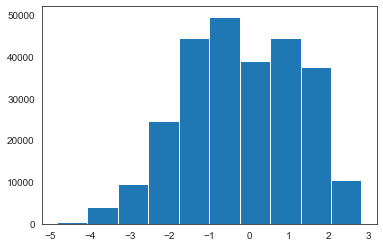

In [53]:
plt.hist(np.log10(posteriors[s].samples['src_f'][:,1,:].flatten()));

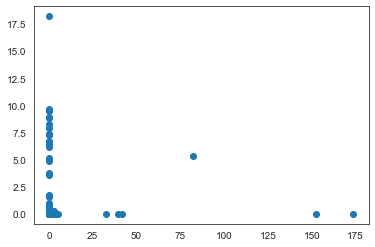

In [51]:
plt.plot(src_f[0,0,:],np.mean(posteriors[s].samples['src_f'][500:1000,0,:],axis=0),'o')

In [48]:
posteriors[0].samples['src_f'].shape

(1000, 4, 264)

ValueError: x and y must have same first dimension, but have shapes (264,) and (4,)

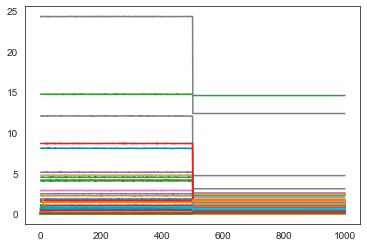

In [60]:
plt.plot(posteriors[s].samples['src_f'][:,0,:]);
plt.plot(np.full((priors[0].nsrc),1000),src_f[s,:,0],'o')

In [155]:
np.argmax(src_f[s,:,0])

151

very large fluxes seem to cause problems. Compare fluxes vs LIR and redshift? Maybe smarter priors on LIR are needed?

Text(0.5, 0, 'log10z')

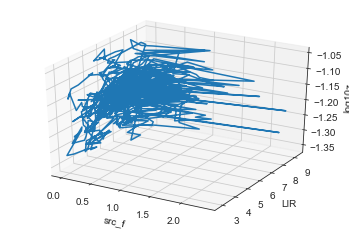

In [218]:
from mpl_toolkits import mplot3d
fig = plt.figure()
o=151
ax = plt.axes(projection='3d')
trans_params=phys_prior.emulator['inverse_transform_parameters'](posteriors[s].samples['params'])
ax.plot3D(posteriors[s].samples['src_f'][:,0,o],trans_params[:,o,0],trans_params[:,o,1]);
ax.set_xlabel('src_f')
ax.set_ylabel('LIR')
ax.set_zlabel('log10z')

In [144]:
phys_samp_prior_pred[s,o,:]

DeviceArray([10.742299  , -0.32464266,  1.553568  ], dtype=float32)

In [145]:
trans_params.shape

(1000, 163, 3)

In [219]:
from xidplus.numpyro_fit import SED_prior
fit_numpyro=SED_prior.all_bands(priors[0:3],phys_prior)
posterior=xidplus.posterior_numpyro_sed(fit_numpyro,priors[0:3],phys_prior)
xidplus.save(priors[0:3],posterior,'prior_XID+SED_ESB_32_added_source_flag_gaia_20210215')

Number of divergences: 11


In [220]:
phys_samp=phys_prior.emulator['inverse_transform_parameters'](posterior.samples['params'])


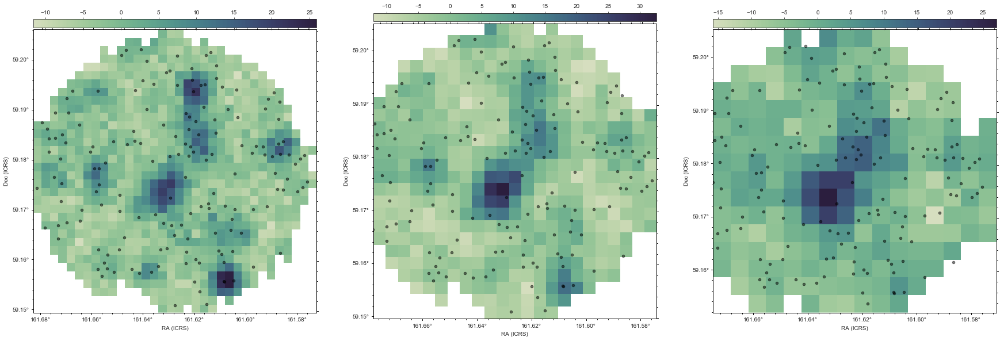

In [221]:
figs,fig=xidplus.plot_map(priors[0:3])

In [223]:
from numpyro.infer import Predictive
from jax import random, vmap


rng_key = random.PRNGKey(0)
rng_key, rng_key_ = random.split(rng_key)
import copy
priors_prior_pred_samp_p=copy.deepcopy(priors[0:3])
#set data to sample data
for i in range(0,3):
    priors_prior_pred_samp_p[i].sim=None
#sample from the prior using numpyro's Predictive function
prior_predictive_p=Predictive(SED_prior.spire_model,posterior_samples = fit_numpyro.get_samples(), num_samples = 50,)
prior_pred_p=prior_predictive_p(random.PRNGKey(0),priors_prior_pred_samp_p,phys_prior)
#Create a list of the model map arrays
mod_map_array_p=[prior_pred_p['obs_psw'].T,prior_pred_p['obs_pmw'].T,prior_pred_p['obs_plw'].T]
#feed the model map arrays the animation function
xidplus.plots.make_map_animation(priors[0:3],mod_map_array_p,50)

In [235]:
xidplus.plots.replicated_map_movie(priors,posterior,50)

In [81]:
#diverged
mod_map_diverge=[]
for i in range(0,3):
    mod_map_diverge.append(mod_map_array_p[i][:,posterior.divergences])
xidplus.plots.make_map_animation(priors[0:3],mod_map_diverge,50)

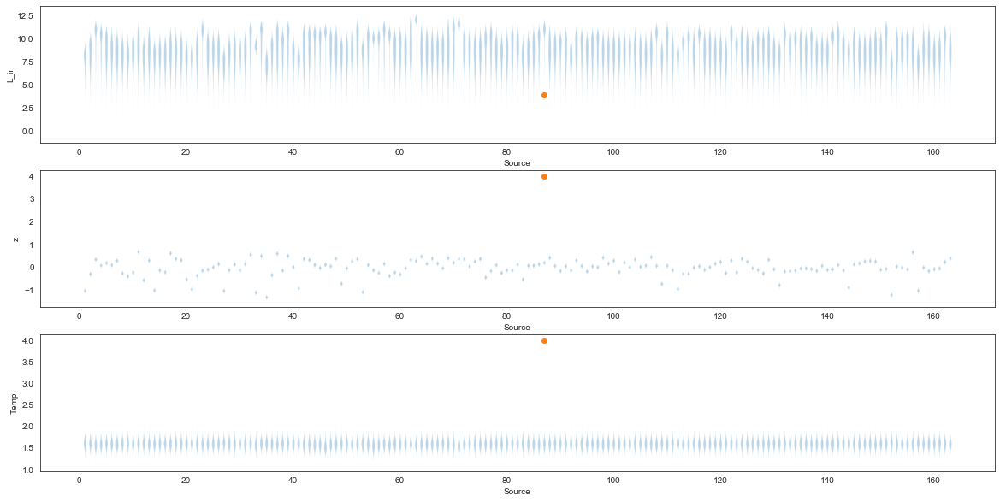

In [228]:
fig,axes=plt.subplots(3,1,figsize=(20,10))
names=[i.split('_mu')[0] for i in phys_prior.prior_table.colnames[0:3]]
for i in range(0,3):
    axes[i].violinplot(phys_samp[...,i].T,showextrema=False);
    axes[i].set_ylabel(names[i])
    axes[i].set_xlabel('Source')
    axes[i].plot(np.arange(1,priors[0].nsrc+1)[ind],4,'o')

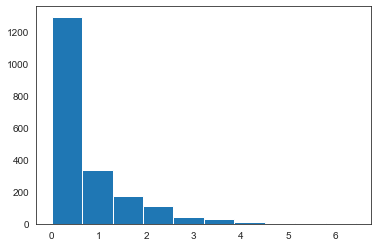

In [77]:
plt.hist(posterior.samples['src_f'][:,0,ind].flatten());

In [227]:
ind=priors[0].ID=='HELP_J104631.082+591021.253'

In [69]:
ind

masked_array(data=[False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False,  True, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False,

Text(0, 0.5, 'z')

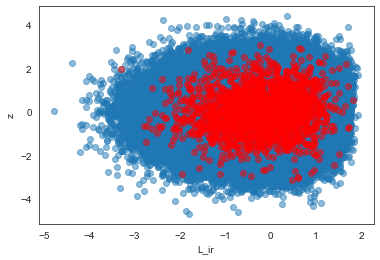

In [229]:
names=[i.split('_mu')[0] for i in phys_prior.prior_table.colnames[0:3]]

non_transformed_params=fit_numpyro.get_samples()['params']
plt.plot(non_transformed_params[:,:,0].flatten(),non_transformed_params[:,:,1].flatten(),'o',alpha=0.5)
plt.plot(non_transformed_params[posterior.divergences,:,0].flatten(),non_transformed_params[posterior.divergences,:,1].flatten(),'ro',alpha=0.5)
plt.xlabel(names[0])
plt.ylabel(names[1])

Text(0, 0.5, 'Temp')

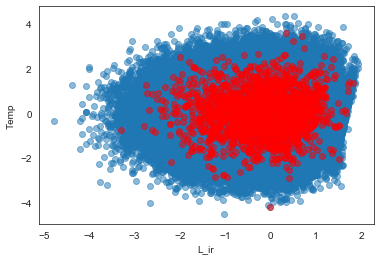

In [230]:
plt.plot(non_transformed_params[:,:,0].flatten(),non_transformed_params[:,:,2].flatten(),'o',alpha=0.5)
plt.plot(non_transformed_params[posterior.divergences,:,0].flatten(),non_transformed_params[posterior.divergences,:,2].flatten(),'ro',alpha=0.5)
plt.xlabel(names[0])
plt.ylabel(names[2])

Text(0, 0.5, 'Temp')

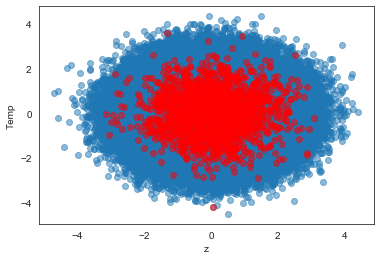

In [231]:
plt.plot(non_transformed_params[:,:,1].flatten(),non_transformed_params[:,:,2].flatten(),'o',alpha=0.5)
plt.plot(non_transformed_params[posterior.divergences,:,1].flatten(),non_transformed_params[posterior.divergences,:,2].flatten(),'ro',alpha=0.5)
plt.xlabel(names[1])
plt.ylabel(names[2])

(array([6.0000e+00, 2.1700e+02, 2.8220e+03, 1.8138e+04, 5.5320e+04,
        8.6486e+04, 6.4693e+04, 1.5531e+04, 2.5530e+03, 2.3400e+02]),
 array([-3.1283345 , -2.7164989 , -2.3046632 , -1.8928276 , -1.4809921 ,
        -1.0691564 , -0.6573208 , -0.2454852 ,  0.16635041,  0.57818604,
         0.99002165], dtype=float32),
 <a list of 10 Patch objects>)

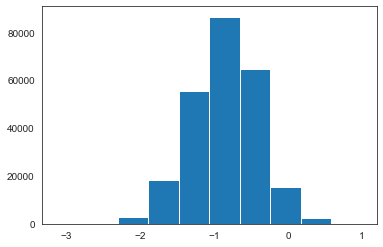

In [40]:
plt.hist(non_transformed_params[:,:,0].flatten())

(array([1.64890e+04, 1.12156e+05, 6.44580e+04, 3.92680e+04, 1.00230e+04,
        3.13100e+03, 4.15000e+02, 4.90000e+01, 8.00000e+00, 3.00000e+00]),
 array([-2.0894804 , -1.5292635 , -0.9690466 , -0.4088297 ,  0.15138721,
         0.7116041 ,  1.271821  ,  1.8320379 ,  2.3922548 ,  2.9524717 ,
         3.5126886 ], dtype=float32),
 <a list of 10 Patch objects>)

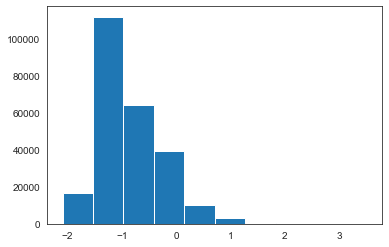

In [41]:
plt.hist(non_transformed_params[:,:,1].flatten())

(array([5.3000e+01, 8.9500e+02, 9.8150e+03, 4.5301e+04, 8.7364e+04,
        7.2747e+04, 2.5679e+04, 3.8910e+03, 2.5100e+02, 4.0000e+00]),
 array([-2.5791354 , -2.030994  , -1.4828527 , -0.9347113 , -0.3865699 ,
         0.1615715 ,  0.70971286,  1.2578542 ,  1.8059957 ,  2.354137  ,
         2.9022784 ], dtype=float32),
 <a list of 10 Patch objects>)

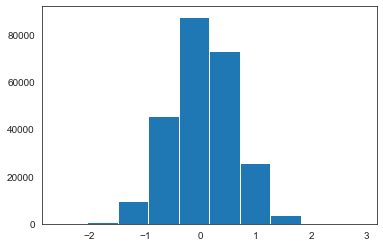

In [42]:
plt.hist(non_transformed_params[:,:,2].flatten())

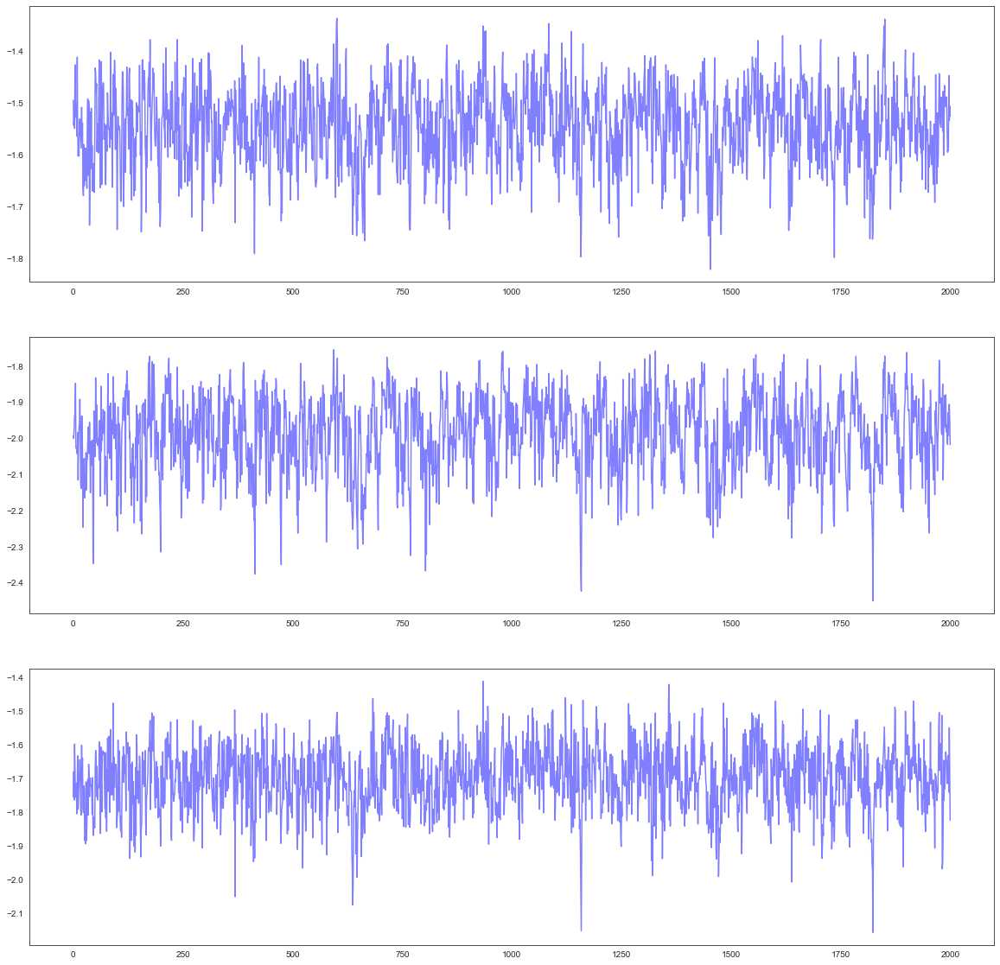

In [232]:
fig,axes=plt.subplots(3,1,figsize=(20,20))

for b in range(0,3):
    axes[b].plot(posterior.samples['bkg'][:,b],color=color,alpha=0.5)

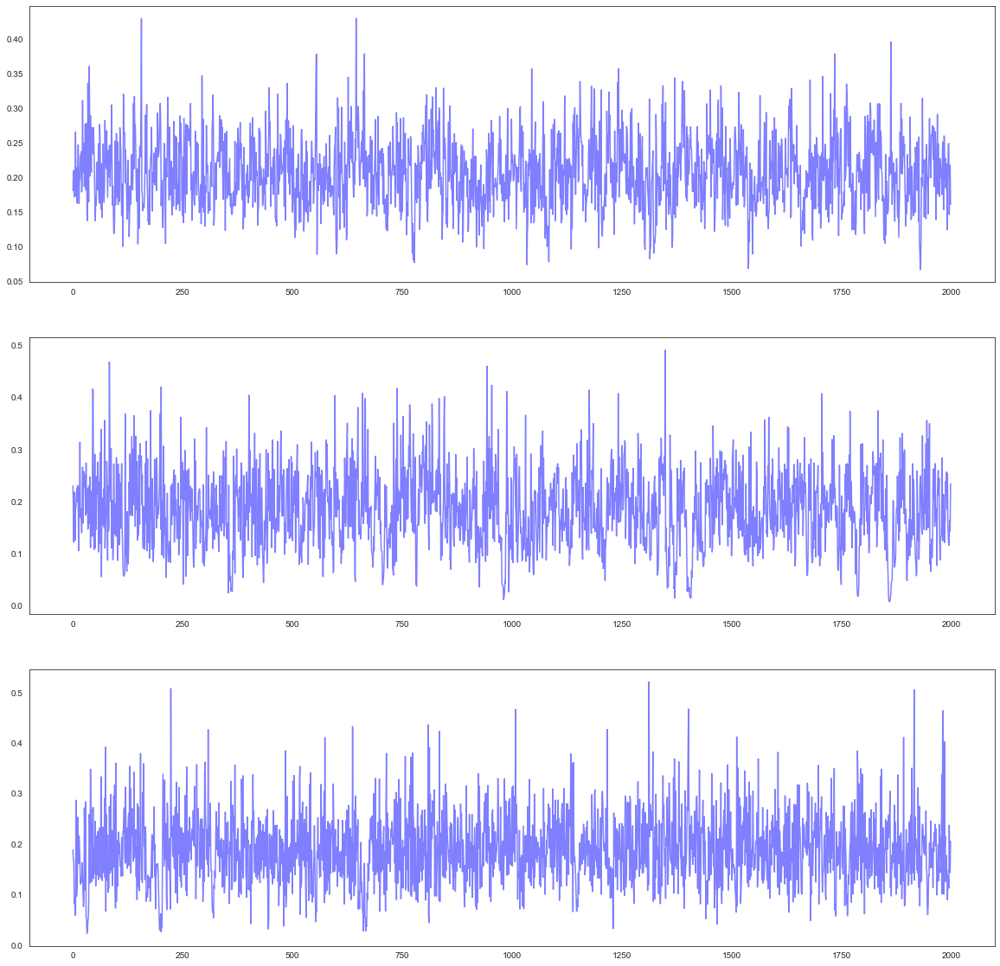

In [233]:
fig,axes=plt.subplots(3,1,figsize=(20,20))

for b in range(0,3):
    axes[b].plot(posterior.samples['sigma_conf'][:,b],color=color,alpha=0.5)

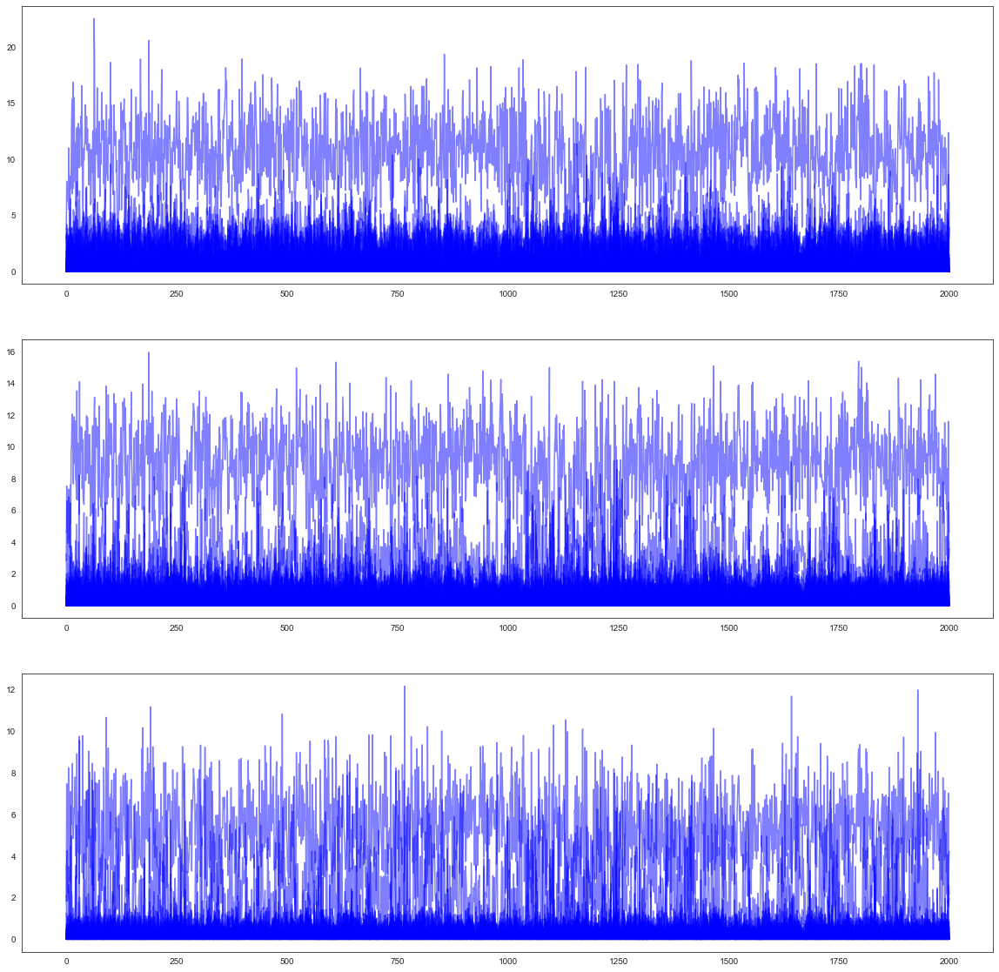

In [237]:
fig,axes=plt.subplots(3,1,figsize=(20,20))

for b in range(0,3):
    axes[b].plot(posterior.samples['src_f'][:,b,:],color=color,alpha=0.5)

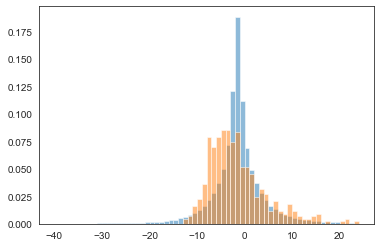

In [273]:
plt.hist(mod_map_array_p[1][:,:].flatten(),bins=np.arange(-40,25),alpha=0.5,normed=True);
plt.hist(priors[1].sim,bins=np.arange(-40,25),alpha=0.5,normed=True);

([<aplpy.core.FITSFigure at 0x7f92df6c4ac8>,
 <Figure size 2160x720 with 6 Axes>)

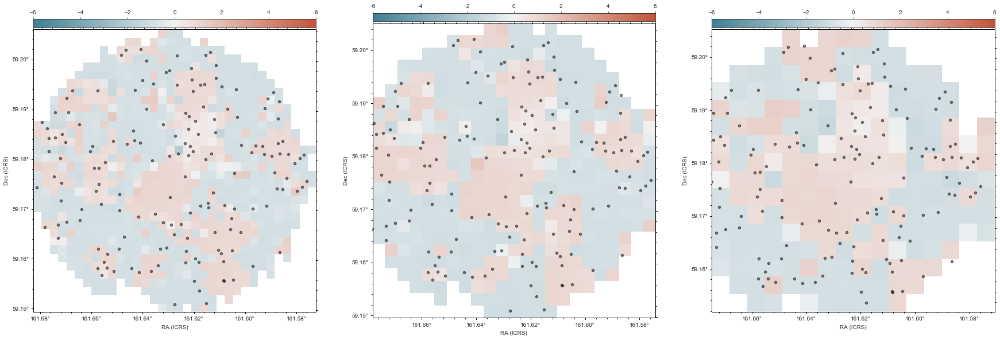

In [256]:
xidplus.plots.plot_Bayes_pval_map(priors,posterior)

where are all the negative pixels coming from?

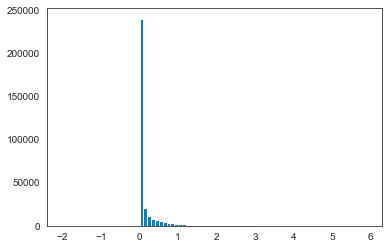

In [283]:
plt.hist(posterior.samples['src_f'][:,0,:].flatten(),bins=np.arange(-2,6,0.1));

if the majority of the sources are zero, it means the background has to be higher, which in turn meanssources that do have higher flux cannot become higher because the background is so high. How do I test?
* Set every source to mean prior LIR and z. What flux do I get?
* Is normal too restrictive? Does it need to be wider? Problem with wider is it could give too low flux for emulator? * Could set too higher? The fluxes would be forced lower by data.
* Fit mu and sigma for LIR? Extreme but cool...

#### Set Every Source to prior LIR and z, get flux

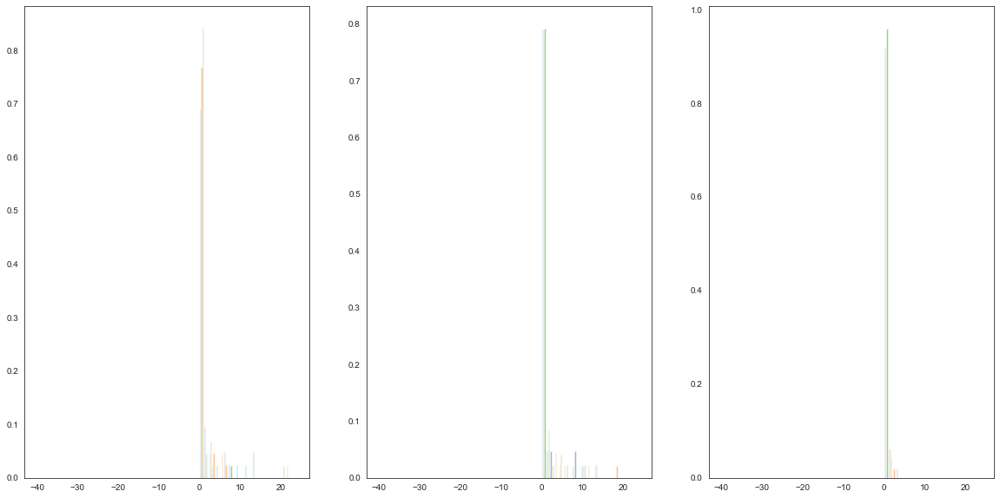

In [289]:
fig,axes=plt.subplots(1,3,figsize=(20,10))
src_f_mu=np.exp(phys_prior.emulator['net_apply'](phys_prior.emulator['params'],phys_prior.params_mu)).shape
for b in range(0,3):
    axes[b].hist(src_f[:,b],alpha=0.5,bins=np.arange(-40,25),normed=True)


In [259]:
posterior.samples['src_f'].shape

(2000, 3, 163)

In [267]:
xidplus.replicated_map_movie(priors,posteriors[0],50)

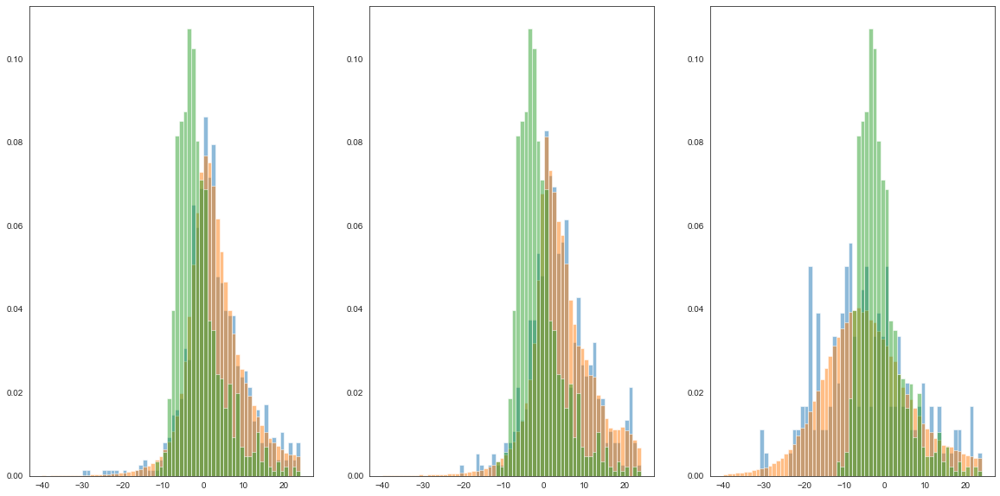

In [272]:
fig,axes=plt.subplots(1,3,figsize=(20,10))
mod_map_temp=xidplus.postmaps.replicated_maps(priors,posteriors[0])
for b in range(0,3):
    axes[b].hist(mod_map_array[b][:,0],alpha=0.5,bins=np.arange(-40,25),normed=True)
    axes[b].hist(mod_map_temp[b][:,:].flatten(),alpha=0.5,bins=np.arange(-40,25),normed=True)
    axes[b].hist(priors[0].sim,bins=np.arange(-40,25),alpha=0.5,normed=True);